<a href="https://colab.research.google.com/github/vmeomeo/vnscienceart/blob/main/12_Advanced_Data_Viz_Practical_Summary.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Final Practical Exercise
**Objective:** Apply EDA techniques to analyze the `Introvert-Extrovert-Ambivert` dataset. Create visualizations using Altair or Plotly (Your Choise). Train a model and visualize it.

---

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt

### Download the dataset from: https://www.kaggle.com/datasets/miadul/introvert-extrovert-and-ambivert-classification

In [2]:
import kagglehub
path = kagglehub.dataset_download("miadul/introvert-extrovert-and-ambivert-classification")

100%|██████████| 4.70M/4.70M [00:00<00:00, 70.2MB/s]

Extracting files...


In [3]:
print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/miadul/introvert-extrovert-and-ambivert-classification/versions/1


In [4]:
!ls /root/.cache/kagglehub/datasets/miadul/introvert-extrovert-and-ambivert-classification/versions/1
!mv /root/.cache/kagglehub/datasets/miadul/introvert-extrovert-and-ambivert-classification/versions/1/personality_synthetic_dataset.csv .

personality_synthetic_dataset.csv


#### Task 1: Data Import and Cleaning
1. Use `pd.read_csv()` with appropriate parameters to import `Introvert-Extrovert-Ambivert`.  
   *(Hint: Inspect the file structure first to determine separators/headers)*
2. Rename columns to meaningful names if needed.
3. Display:  
   - First 8 rows  
   - Data summary using `.info()`  
   - Descriptive statistics using `.describe()`

---

In [5]:
data = pd.read_csv("personality_synthetic_dataset.csv")
data.head(8)

,personality_type,social_energy,alone_time_preference,talkativeness,deep_reflection,group_comfort,party_liking,listening_skill,empathy,creativity,...,spontaneity,adventurousness,reading_habit,sports_interest,online_social_usage,travel_desire,gadget_usage,work_style_collaborative,decision_speed,stress_handling
0,Extrovert,6.794295,3.854670,8.725446,2.515151,7.097368,8.588762,6.774799,6.430132,6.142968,...,4.853313,8.257134,5.270555,10.000000,9.154296,4.816422,9.191711,8.313590,8.032376,7.176905
1,Ambivert,6.378988,5.731157,7.029529,7.274493,4.111199,3.258248,5.550909,3.958179,6.149457,...,6.067201,6.289347,5.753165,5.334303,4.683781,4.725666,5.956141,5.890619,3.158988,3.423577
2,Ambivert,7.459421,6.322263,3.922269,4.622261,5.343276,7.452152,9.483990,6.127654,7.032017,...,5.524244,9.238784,5.250405,3.153540,5.000338,6.139166,6.033048,5.807500,4.571003,5.647480
3,Extrovert,6.159626,3.097837,6.019093,1.965440,7.837140,10.000000,9.436733,8.949684,8.923875,...,4.327018,8.489791,5.312617,8.379936,7.601946,6.370056,5.410145,6.671781,6.600233,5.870088
4,Introvert,5.568462,6.986722,3.913240,9.926161,1.650483,0.362298,7.470387,6.756837,9.507803,...,5.187689,3.167217,7.060235,2.333388,7.771569,5.534336,5.704598,5.832968,5.813099,3.758084
5,Introvert,2.807173,6.326097,2.770085,5.617670,4.752116,0.302630,7.137657,5.399156,4.564805,...,3.888344,1.868406,9.188567,4.817574,3.427446,4.674632,4.027299,3.048724,2.774809,4.560962
6,Introvert,1.537468,7.605496,4.294666,9.166947,3.085335,1.042874,10.000000,5.899131,5.423302,...,7.906636,3.173683,9.458013,2.272047,5.218917,2.745851,4.056359,5.695608,3.230287,6.761266
7,Ambivert,6.636632,4.350586,7.131511,5.455061,2.530413,3.081656,5.177344,5.692996,3.951603,...,3.643867,7.601721,5.803109,5.024010,7.029383,6.990230,7.147859,4.680890,5.107637,7.246737


In [6]:
data.columns

Index(['personality_type', 'social_energy', 'alone_time_preference',
       'talkativeness', 'deep_reflection', 'group_comfort', 'party_liking',
       'listening_skill', 'empathy', 'creativity', 'organization',
       'leadership', 'risk_taking', 'public_speaking_comfort', 'curiosity',
       'routine_preference', 'excitement_seeking', 'friendliness',
       'emotional_stability', 'planning', 'spontaneity', 'adventurousness',
       'reading_habit', 'sports_interest', 'online_social_usage',
       'travel_desire', 'gadget_usage', 'work_style_collaborative',
       'decision_speed', 'stress_handling'],
      dtype='object')

**Note:** Because the names of each column are already straight-forward, so I will process the table without renaming the columns

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   personality_type          20000 non-null  object 
 1   social_energy             20000 non-null  float64
 2   alone_time_preference     20000 non-null  float64
 3   talkativeness             20000 non-null  float64
 4   deep_reflection           20000 non-null  float64
 5   group_comfort             20000 non-null  float64
 6   party_liking              20000 non-null  float64
 7   listening_skill           20000 non-null  float64
 8   empathy                   20000 non-null  float64
 9   creativity                20000 non-null  float64
 10  organization              20000 non-null  float64
 11  leadership                20000 non-null  float64
 12  risk_taking               20000 non-null  float64
 13  public_speaking_comfort   20000 non-null  float64
 14  curios

**Note:** We can see that there are no missing values. The data types are correct and the variables are continuous variables (not categorial).

In [8]:
data.describe()

,social_energy,alone_time_preference,talkativeness,deep_reflection,group_comfort,party_liking,listening_skill,empathy,creativity,organization,...,spontaneity,adventurousness,reading_habit,sports_interest,online_social_usage,travel_desire,gadget_usage,work_style_collaborative,decision_speed,stress_handling
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,5.509190,5.454690,5.525955,5.958689,6.014381,5.040063,6.964450,6.483220,5.996018,5.973280,...,5.495280,5.033716,5.940795,5.492490,6.498574,5.508935,6.006893,6.501986,5.516168,5.981982
std,2.468526,2.493731,2.488006,2.162427,2.178551,2.810563,1.647944,1.534911,1.496690,1.697589,...,1.922809,2.203344,2.170924,1.931728,1.889493,1.932081,1.683523,1.889782,1.944257,1.490327
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.308044,0.804853,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.590989,3.509578,3.595866,4.382619,4.415537,2.727584,5.812701,5.448486,4.992667,4.805742,...,4.156240,3.429189,4.325104,4.127064,5.157772,4.155375,4.867919,5.160594,4.149764,4.973047
50%,5.540706,5.464038,5.574786,5.972345,6.051489,5.053005,6.989855,6.481365,6.003320,5.986871,...,5.499699,5.045021,5.962857,5.508153,6.528960,5.498701,6.006740,6.525735,5.528102,5.978661
75%,7.424123,7.416314,7.472371,7.598495,7.668598,7.363676,8.155574,7.521483,7.013412,7.142282,...,6.853083,6.656162,7.564929,6.861487,7.885414,6.877156,7.160525,7.878841,6.905844,6.991311
max,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


**Note (irrelevant to the tasks):** The question here is: How can they measure these very qualitative variables, like `social_energy`, `curiosity`, etc.?

#### Task 2: Correlation Analysis
1. **Pearson Correlation:**  
   - Adapt the `create_corr_chart()` function to visualize Pearson correlations.  
   - Show only the **upper triangle** of the matrix.  
2. **Mutual Information Matrix:**  
   - Calculate the correlation matrix or Use heatmap to plot correlation.
   - Calculate the (pairwise) mutual information matrix for each feature (dataframe column) and plot it. Use built-in functions of the *sklearn* library.

---

In [9]:
from sklearn.metrics import mutual_info_score

In [10]:
# Pearson correlation using create_corr_chart() taken from assignment 09
def create_corr_chart (data):

    # Removing target column
    new_data = data.drop ('personality_type', axis = 1)

    # We are using Pearson correlation.
    # We need reset_index and melt to transform data set from wide to long format
    # For more info: https://altair-viz.github.io/user_guide/data.html#data-long-vs-wide
    corr = new_data.corr(method = 'pearson').reset_index().melt('index')
    corr.columns = ['var_1', 'var_2', 'correlation']

    # Create correlation matrix chart
    chart = alt.Chart(corr).mark_rect().encode(
        alt.X ('var_1', title = None, axis = alt.Axis(labelAngle = -45, gridColor='white', gridWidth=50)),
        alt.Y ('var_2', title = None),
        alt.Color('correlation', legend = None, scale = alt.Scale(scheme = 'redblue', reverse = True)),
    ).properties(
        width = alt.Step(40),
        height = alt.Step(40)
    )

    # Create text values for each colored element on top of existing chart
    chart += chart.mark_text(size = 12).encode(
        alt.Text ('correlation', format = ".2f"),
        color = alt.condition("abs(datum.correlation) > 0.5", alt.value('white'), alt.value('black'))
    )

    # If we want to return the chart with upper triangle as well, we should remove .transform...
    return chart.transform_filter("datum.var_1 > datum.var_2")


In [11]:
chart_corr = create_corr_chart (data)
chart_corr

alt.LayerChart(...)

In [12]:
# Mutual Information Matrix
# Calculate the correlation matrix or Use heatmap to plot correlation.

from sklearn.feature_selection import mutual_info_regression
import numpy as np

def create_mi_chart(data):
    # Drop target column
    new_data = data.drop ('personality_type', axis = 1)
    cols = new_data.columns
    n = len(cols)

    # Compute mutual information matrix
    mi_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i == j:
                mi_matrix[i, j] = 0
            else:
                mi = mutual_info_regression(new_data[[cols[i]]], new_data[cols[j]])
                mi_matrix[i, j] = mi[0]

    # Convert matrix to long-format DataFrame
    mi_df = pd.DataFrame(mi_matrix, index=cols, columns=cols).reset_index().melt('index')
    mi_df.columns = ['var_1', 'var_2', 'mutual_info']

    # Plot with Altair
    chart = alt.Chart(mi_df).mark_rect().encode(
        alt.X('var_1', title=None, axis=alt.Axis(labelAngle=-45)),
        alt.Y('var_2', title=None),
        alt.Color('mutual_info', legend=None, scale=alt.Scale(scheme='viridis'))
    ).properties(
        width=alt.Step(40),
        height=alt.Step(40)
    )

    chart += chart.mark_text(size=12).encode(
        alt.Text('mutual_info', format=".2f"),
        color=alt.condition("datum.mutual_info < 1", alt.value('white'), alt.value('black'))
    )

    return chart.transform_filter("datum.var_1 < datum.var_2")
chart_mi= create_mi_chart(data)
chart_mi

alt.LayerChart(...)

#### Task 3: Parallel Coordinates Plot
1. **Data Scaling:**  
   Normalize the data (use `MinMaxScaler`) and create a parallel coordinates plot.  
2. **Interactivity:**  
   Implement hover-based filtering:  
   - Lines matching the hovered target class remain colored  
   - All other lines turn gray.  
3. **Axis Optimization:**  
   Reorder axes to minimize line crossings.  

---

In [13]:
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, leaves_list

In [14]:
def normalize_data(df, target_col):
    """Normalize features using MinMaxScaler while preserving the target column."""
    features = df.drop(columns=[target_col])
    target = df[target_col]

    scaler = MinMaxScaler()
    normalized_features = scaler.fit_transform(features)

    normalized_df = pd.DataFrame(normalized_features, columns=features.columns)
    normalized_df[target_col] = target.values
    return normalized_df

In [15]:
def optimize_axis_order(df, target_col):
    """Optimize axis order to minimize line crossings using hierarchical clustering."""
    features = df.drop(columns=[target_col])

    # Calculate correlation matrix and handle NaN values
    corr_matrix = features.corr().abs()
    corr_matrix = corr_matrix.fillna(0)  # Replace NaN with 0 if any exist

    # Ensure the matrix is symmetric
    corr_matrix = (corr_matrix + corr_matrix.T) / 2

    # Convert correlation to distance
    distance_matrix = 1 - corr_matrix

    # Perform hierarchical clustering
    try:
        Z = linkage(squareform(distance_matrix, checks=False), 'average')
        optimal_order = leaves_list(Z)
        ordered_columns = [features.columns[i] for i in optimal_order]
    except:
        # Fallback to original order if clustering fails
        ordered_columns = features.columns.tolist()

    return ordered_columns

In [21]:
def create_parallel_plot(df, target_col):
    """Create an interactive parallel coordinates plot with hover-based filtering."""
    # Normalize the data
    normalized_df = normalize_data(df, target_col)

    # Convert categorical target to numerical codes for coloring
    normalized_df['color_code'] = pd.Categorical(normalized_df[target_col]).codes

    # Optimize axis order
    ordered_columns = optimize_axis_order(normalized_df, target_col)

    # Create the plot
    fig = px.parallel_coordinates(
        normalized_df,
        color='color_code',
        dimensions=ordered_columns + [target_col],
        color_continuous_scale=px.colors.diverging.Tealrose,
        labels={col: col for col in ordered_columns + [target_col]}
    )

    # Customize the plot appearance
    fig.update_layout(
        title='Interactive Parallel Coordinates Plot',
        hovermode='closest',
        dragmode='select',
        template='plotly_white',
        height=600,
        width=2000
    )

    # Show the plot
    fig.show()

In [22]:
if __name__ == "__main__":
    # Assuming df is your DataFrame and 'personality_type' is your target column
    df_sorted = data.sort_values("personality_type")

    # Create plot with full dataset
    create_parallel_plot(df_sorted, 'personality_type')

    # Create plot with sample
    df_sample = df_sorted[:30]
    create_parallel_plot(df_sample, 'personality_type')

#### Task 4: Scatter Plot Matrix
1. Create a scatter plot matrix colored by target classes.  
2. Implement **linking and brushing**:  
   - Selected points in one plot highlight *across all plots*  
   - Use Altair’s `interval` or `point` selection.  
3. Show **only the lower triangle** of the matrix.  

## Congratulations! 🎉, if you arrived here.
---

In [23]:
from itertools import combinations

def create_scatter_matrix(data, target_col='personality_type', sample_size=100):
    """
    Create a scatter plot matrix with linking/brushing, showing only lower triangle.

    Parameters:
    - data: pandas DataFrame
    - target_col: name of the target column (default 'personality_type')
    - sample_size: number of points to sample (default 100)
    """
    # Sample the data if needed (Altair works best with <5000 points)
    if len(data) > sample_size:
        data = data.sample(sample_size)

    # Get feature columns (exclude target)
    features = [col for col in data.columns if col != target_col]

    # Create selection
    brush = alt.selection_point(name='brush')  # or interval selection

    # Base chart with selection
    base = alt.Chart(data).add_params(brush).encode(
        color=alt.condition(
            brush,
            f'{target_col}:N',
            alt.value('lightgray')
        )
    ).properties(
        width=150,
        height=150
    )

    # Create lower triangle plots
    charts = []
    for i, j in combinations(range(len(features)), 2):
        x_feat = features[j]  # Note reversed order for lower triangle
        y_feat = features[i]

        chart = base.mark_circle(size=30).encode(
            alt.X(x_feat, type='quantitative', scale=alt.Scale(nice=True)),
            alt.Y(y_feat, type='quantitative', scale=alt.Scale(nice=True)),
            tooltip=[target_col] + features
        )
        charts.append(chart)

    # Combine all charts - fixed syntax here
    matrix = alt.vconcat(
        *[alt.hconcat(*charts[i:i+len(features)-1])
          for i in range(0, len(charts), len(features)-1)]
    )

    return matrix

In [24]:
scatter_matrix = create_scatter_matrix(data, target_col='personality_type', sample_size=100)
scatter_matrix

alt.VConcatChart(...)

#### Task 5: Training a model and evaluating it.
1. Train a RandomForestClassifier or DecisionTreeClassifier using `sklearn` to predict the personality type.
2. Calculate the F1 Score. Visualize the F1 Score using interactive confusion matrix (Hint: https://www.kaggle.com/code/samanemami/interactive-confusion-matrix)

##### Original code
Kaggle: https://www.kaggle.com/code/samanemami/interactive-confusion-matrix

In [45]:
!pip install binclass-tools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.7/40.7 kB 1.6 MB/s eta 0:00:00


In [47]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import bctools as bc
import numpy as np
from ipywidgets import widgets
from sklearn.metrics import confusion_matrix
from IPython.display import HTML

In [58]:
def compute_metrics(TN, FP, FN, TP):
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
    f1_score = 2 * (precision * recall) / (precision + recall)

    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1_score
    }

    return metrics

def get_confusion_matrix_and_metrics_df(true_y, predicted_proba, threshold, normalize=None):
        # Compute the confusion matrix
        predicted_y = (predicted_proba >= threshold).astype(int)
        matrix = confusion_matrix(true_y, predicted_y, normalize=normalize)

        # Compute metrics
        TN, FP, FN, TP = matrix.ravel()
        metrics = compute_metrics(TN, FP, FN, TP)

        # Create metrics dataframe
        metrics_df = pd.DataFrame(metrics, index=['Metric'], columns=['Value'])

        return matrix, metrics_df

def plot_confusion_matrix_with_sliders(y_true, predicted_proba, threshold_positive, threshold_negative):
    # Create the sliders

    slider_positive = widgets.FloatSlider(value=threshold_positive, min=0.0, max=1.0, step=0.01, description='Threshold Positive')
    slider_negative = widgets.FloatSlider(value=threshold_negative, min=0.0, max=1.0, step=0.01, description='Threshold Negative')

    def update_plot(*args):
        # Get the updated threshold values
        threshold_positive = slider_positive.value
        threshold_negative = slider_negative.value

        # Call the modified confusion_matrix_plot function
        fig, metrics_dep_on_threshold_df, constant_metrics_df, optimal_thresholds_df = bc.confusion_matrix_plot(y_true, predicted_proba,
                                                                                                             threshold_step=0.01,
                                                                                                             amounts=None, cost_dict=None,
                                                                                                             currency='€',
                                                                                                             title='Interactive Confusion Matrix')
        # Update the confusion matrix based on the new threshold values
        fig.data[2].visible = True  # First confusion matrix
        fig.data[2].z = get_confusion_matrix_and_metrics_df(y_true, predicted_proba, threshold_positive, normalize=None)[0]

        fig.data[4].visible = True  # Second confusion matrix
        fig.data[4].z = get_confusion_matrix_and_metrics_df(y_true, predicted_proba, threshold_negative, normalize=None)[0]

        # Update the figure
        fig.update_layout(sliders=[dict(active=0, currentvalue={"prefix": "Threshold: "}, pad=dict(t=50))])
        fig.show()

    # Register the update function to be called when sliders change
    slider_positive.observe(update_plot, 'value')
    slider_negative.observe(update_plot, 'value')

    # Display the sliders and initial plot
    display(widgets.VBox([slider_positive, slider_negative]))
    update_plot()

In [56]:
def get_probability_array(true_values):
    num_samples = len(true_values)

    # Generate random probabilities between 0 and 1
    probabilities = np.random.rand(num_samples)

    # Convert probabilities to binary predictions
    predictions = np.round(probabilities).astype(int)

    return probabilities, predictions

In [59]:
true_values = [0, 1, 1, 0, 1]
probabilities, predictions = get_probability_array(true_values)
# Set initial threshold values
threshold_positive = 0.5
threshold_negative = 0.5

plot_confusion_matrix_with_sliders(true_values, probabilities, threshold_positive, threshold_negative)

So far, I cannot make the original version show up via Google Colab, thus, to reproduce and adapt from this, we have a final version at the end of this task that works.

##### Adapted from Kaggle

In [ ]:
def compute_metrics(cm, class_index):
    """Compute metrics for a specific class in a multi-class confusion matrix."""
    TP = cm[class_index, class_index]
    FN = cm[class_index, :].sum() - TP
    FP = cm[:, class_index].sum() - TP
    TN = cm.sum() - (TP + FN + FP)

    accuracy = (TP + TN) / cm.sum() if cm.sum() > 0 else 0
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1_score,
        'True Positives (TP)': int(TP),
        'False Positives (FP)': int(FP),
        'False Negatives (FN)': int(FN),
        'True Negatives (TN)': int(TN)
    }

    return metrics

In [ ]:
def get_confusion_matrix_and_metrics_df(y_true, y_pred, classes=None, normalize=None):
    """
    Compute the confusion matrix and class-wise metrics for multi-class classification.
    This version assumes y_pred are the predicted class labels (not probabilities).
    """
    # Compute the confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=classes, normalize=normalize)

    # Compute metrics for each class
    metrics_data = []
    for i, cls in enumerate(classes):
        metrics = compute_metrics(cm, i)
        metrics_data.append({'Class': cls, **metrics})

    metrics_df = pd.DataFrame(metrics_data)

    return cm, metrics_df

##### Version (that works) but no slider

In [25]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, f1_score
import plotly.graph_objects as go

In [ ]:
# 1. Prepare the data and train the model
X = data.drop("personality_type", axis=1)
y = data["personality_type"]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Train Random Forest
model = RandomForestClassifier(
    n_estimators=100,  # Increased from 3 to 100 for better performance
    random_state=42,
    class_weight='balanced'  # Handles class imbalance if present
)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

In [ ]:
# 2. Create interactive confusion matrix with F1 scores
def interactive_confusion_matrix(y_true, y_pred, classes=None, title="Confusion Matrix", width=800, height=700):
    """
    Creates an interactive confusion matrix with class-wise F1 score visualization

    Parameters:
        y_true: Array of true labels
        y_pred: Array of predicted labels
        classes: List of class names in order
        title: Title for the plot
        width: Width of the plot
        height: Height of the plot
    """
    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=classes)

    # Calculate F1 scores
    f1_scores = f1_score(y_true, y_pred, average=None, labels=classes)
    f1_scores_dict = dict(zip(classes, f1_scores))

    # Create base figure
    fig = go.Figure()

    # Add heatmap
    fig.add_trace(go.Heatmap(
        z=cm,
        x=classes,
        y=classes,
        colorscale='Blues',
        hoverongaps=False,
        colorbar=dict(title='Count'),
        name="Confusion Matrix"
    ))

    # Add annotations (only counts)
    annotations = []
    for i in range(len(classes)):
        for j in range(len(classes)):
            annotations.append(
                dict(
                    x=classes[j],
                    y=classes[i],
                    text=str(cm[i, j]),
                    font=dict(color='white' if cm[i, j] > cm.max()/2 else 'black'),
                    showarrow=False
                )
            )

    # Create buttons for class highlighting
    buttons = []
    for i, cls in enumerate(classes):
        # Create mask for highlighting
        mask = np.zeros_like(cm)
        mask[i, :] = 1  # Highlight row
        mask[:, i] = 1  # Highlight column

        # Create highlighted version
        highlighted = cm.copy()
        highlighted = highlighted * mask  # Keep only highlighted cells
        highlighted[highlighted == 0] = cm.max() / 10  # Dim other cells

        buttons.append(
            dict(
                label=f"{cls} (F1: {f1_scores_dict[cls]:.2f})",
                method='update',
                args=[{
                    'z': [highlighted],
                    'annotations': annotations # Keep only count annotations for updates
                }],
            )
        )

    # Add dropdown menu
    fig.update_layout(
        updatemenus=[{
            "buttons": buttons,
            "direction": "down",
            "showactive": True,
            "x": 0.1,
            "y": 1.15
        }],
        annotations=annotations, # Use initial annotations for the base plot
        title={
            'text': f"{title}<br><sup>Click dropdown to highlight classes</sup>",
            'x': 0.5,
            'xanchor': 'center'
        },
        xaxis_title='Predicted Label',
        yaxis_title='True Label',
        width=width,
        height=height,
        margin=dict(t=150)
    )
    return fig

In [ ]:
# 3. Display
classes = ['Introvert', 'Ambivert', 'Extrovert']  # Replace with your actual classes
fig = interactive_confusion_matrix(
    y_test,
    y_pred,
    classes=classes,
    title="Personality Type Classification Results",
    width=500,  # Example width
    height=500   # Example height
)
fig.show()

#### Task 6: Explaining the model
1. Use SHAP values to interpret the model. (Hint: https://www.kaggle.com/code/vikumsw/explaining-random-forest-model-with-shapely-values)
2. Explore using Google or ask the LLMs. Then, examine the results from SHAP and determine whether the high-contributing features influence the `introvert-extrovert-ambivert` in real-life.

## If you did complete all the tasks until Task-6, you earn a cup of coffee from me. ☕

In [32]:
!pip install shap

### Task 6: Explaining the model with SHAP values

SHAP (SHapley Additive exPlanations) is a method used to explain the output of any machine learning model. It connects optimal credit allocation with local explanations by using the classic Shapley values from game theory.

In simpler terms, SHAP values tell us how much each feature in our dataset contributes to the model's prediction for a specific instance. A positive SHAP value for a feature means that feature pushed the prediction higher, while a negative value pushed it lower.

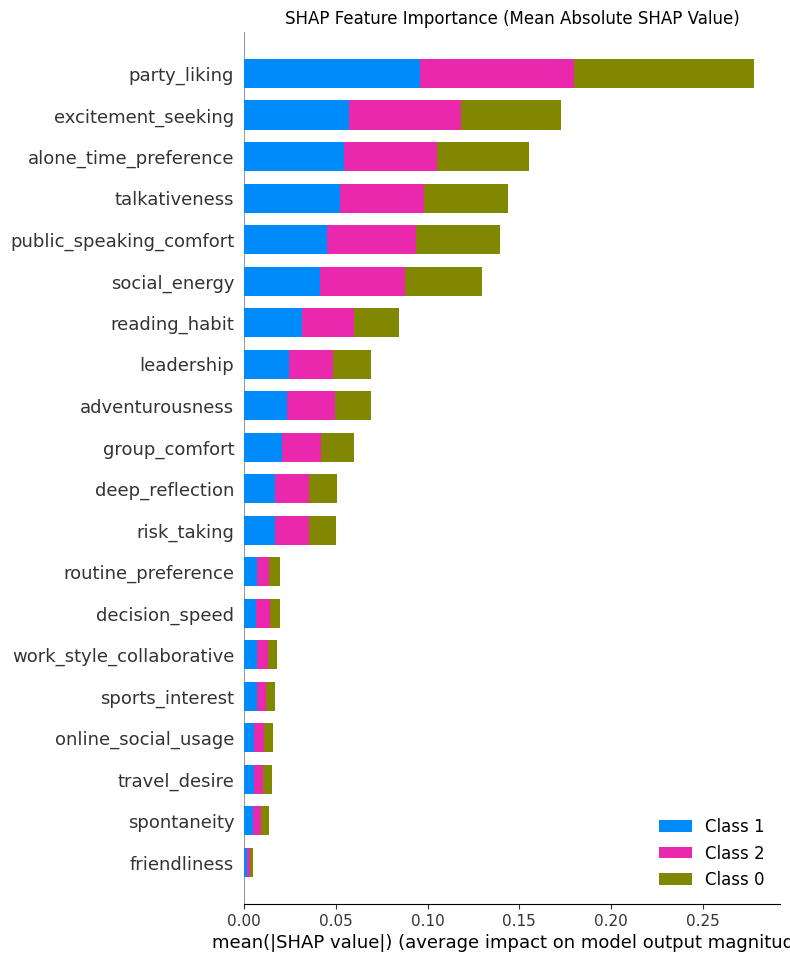

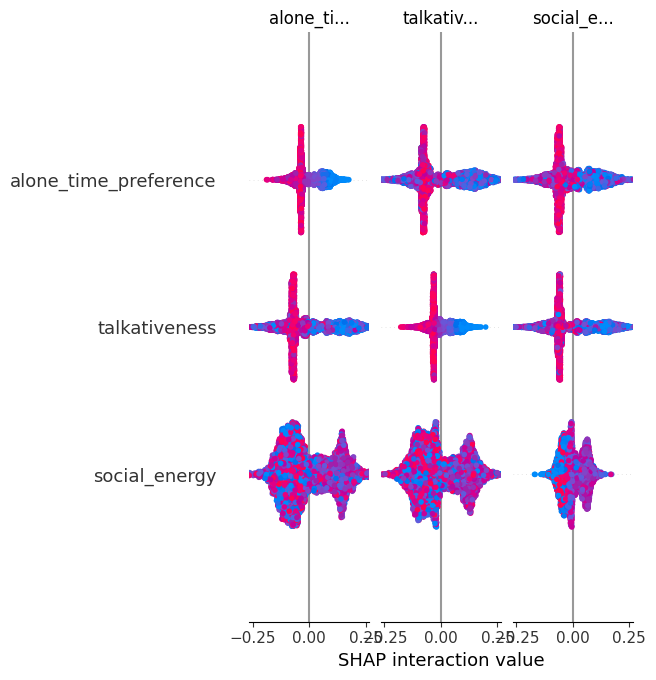

In [33]:
import shap

# Create a SHAP explainer object
# For tree-based models like RandomForestClassifier, TreeExplainer is efficient
explainer = shap.TreeExplainer(model)

# Calculate SHAP values for the test set
# This might take some time depending on the size of your test set and model complexity
shap_values = explainer.shap_values(X_test)

# Visualize the SHAP values
# Summary plot shows the impact of features on model output
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns, plot_type="bar", show=False)
plt.title("SHAP Feature Importance (Mean Absolute SHAP Value)")
plt.show()

# Summary plot showing the distribution of SHAP values for each feature
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns, show=False)
plt.show()

The first SHAP summary plot (bar chart) shows the global importance of each feature. Features are ranked by the sum of the absolute SHAP values across all instances. A higher value means the feature has a larger overall impact on the model's output.

The second SHAP summary plot (dot plot) shows the distribution of SHAP values for each feature.
- Each point on the plot is a single instance from the test set.
- The position on the x-axis represents the SHAP value for that feature and instance.
- The color of the point represents the feature value (e.g., red for high, blue for low).
- The y-axis lists the features in order of global importance (from the bar plot).

By examining these plots, we can identify which features are most important for the model's predictions and how the values of those features influence the predictions for different instances.

Now, let's consider whether the high-contributing features influence introvert-extrovert-ambivert in real-life, based on the SHAP analysis.

##### **Plot 1: SHAP Feature Importance (Mean Absolute SHAP Value)**
This stacked bar chart shows how much each feature contributes (on average) to the model's predictions across all classes.

**Interpretation:**
- X-axis: Mean absolute SHAP value → this is the average contribution (positive or negative) of a feature to the prediction magnitude.

- Y-axis: Input features ranked by total importance.

- Bars:

  Stacked by class: each color corresponds to a class.

      Blue = Class 1
      Pink = Class 2
      Olive = Class 0

  The longer the total bar → the more influential the feature.

**Insights:**
- `party_liking` is the most important feature overall.

- It heavily influences predictions for all three classes, especially `Class 0` (olive).

- `talkativeness`, `alone_time_preference`, and `excitement_seeking` are also high-impact.

##### **Plot 2: SHAP Interaction Values (Violin Plot Matrix)**
This matrix visualizes SHAP interaction values, which measure how pairs of features interact to influence predictions.

Interpretation:
- X and Y axes: Top 3 interacting features selected → `alone_time_preference`, `talkativeness`, `social_energy`

- Each cell shows a violin plot of interaction values for the corresponding feature pair.

- Colors: Likely represent SHAP values for each class (e.g., pink/blue for different classes).

We can see that, the wider the distribution → the more interaction effect exists between those two features.

The diagonal shows self-interaction (a feature interacting with itself = its main effect).

Off-diagonal cells show pairwise interactions.

**Insights**:
`social_energy` interacts strongly with itself (bottom right) and with `talkativeness` and `alone_time_preference`.

Interactions are asymmetrical — the effect of A with B ≠ effect of B with A, but SHAP shows symmetric views.